In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec


import torch
import torchvision
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F

from sklearn import preprocessing
from skimage import data, color, img_as_float
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.kernel_approximation import RBFSampler

import os
import requests
import warnings

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
print(torch.cuda.is_available())


True


In [54]:
def factorize(A, k, epsilon = 0.001,device=torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    A=A.to(device)
    
    #Randomly initialize W,H
    W = torch.randn(A.shape[0], A.shape[1], k, requires_grad=True, device=device)
    H = torch.randn(A.shape[0], k, A.shape[2], requires_grad=True, device=device)
    
    #optimizer
    optimizer=optim.Adam([W,H],lr=0.01)
    
    mask=~torch.isnan(A)
    
    epoch=0;
    while(True):
        epoch+=1
        # Compute the loss
        diff_mat=A-torch.matmul(W,H)
        diff_vect=diff_mat[mask]
        loss=torch.norm(diff_vect)
        
        # Zero the gradients
        optimizer.zero_grad()
        
                # Backpropagate
        loss.backward()

        # Update the parameters
        optimizer.step()
        
        if epoch>1:
            if(abs(prev_loss-loss)<epsilon):
                break
        prev_loss=loss
        
        if(epoch>10000):
            print("maximum epoch limit riched")
            break
    return W,H,loss

In [55]:
def plot_images(actual_image,masked_image,reconstructed_image):
    actual_image=actual_image.detach().cpu()
    masked_image=masked_image.detach().cpu()
    reconstructed_image=reconstructed_image.detach().cpu()
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(masked_image.permute(1, 2, 0) / 255)
    ax[0].set_title("masked image")
    ax[1].imshow(actual_image.permute(1, 2, 0) / 255)
    ax[1].set_title("Original image")
    ax[2].imshow(reconstructed_image.permute(1, 2, 0) / 255)
    ax[2].set_title("Reconstructed image")
    plt.show()
    return

In [56]:
import math
def compute_metrics(original, reconstructed, mask=None):
    # If mask provided, evaluate only masked pixels
    original = original.detach().cpu()/255
    reconstructed = reconstructed.detach().cpu()/255

    if mask is not None:
        diff = (reconstructed - original)[:,mask]
    else:
        diff = (reconstructed - original).view(-1)
        
    rmse = torch.sqrt(torch.mean(diff**2)).item()
    
    # PSNR
    mse = torch.mean(diff**2).item()
    if mse == 0:
        psnr = float('inf')
    else:
        psnr = 20 * math.log10(1.0 / math.sqrt(mse))  # assuming image in [0,1]
    
    return rmse, psnr

In [57]:
import torch

def factorize_als(A, k, epsilon=0.01, device=torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    """
    Alternating Least Squares (ALS) for 3D image tensor (C × H × W)
    This version updates H first, then W in each iteration.
    """

    # ---- Initialization ----
    A = A.to(device)
    mask = ~torch.isnan(A)  # Mask of valid pixels (True where not NaN)

    # Initialize low-rank factors
    W = torch.randn(A.shape[0], A.shape[1], k, device=device)  # (C, H, k)
    H = torch.randn(A.shape[0], k, A.shape[2], device=device)  # (C, k, W)

    epoch = 0
    while True:
        epoch += 1

        # Update H for each channel
        for c in range(A.shape[0]):
            for j in range(A.shape[2]):  # For each column in image
                rows = mask[c, :, j]
                if rows.sum() == 0:
                    continue
                X = W[c, rows, :]              # Shape: (#valid_rows, k)
                y = A[c, rows, j].unsqueeze(1) # (#valid_rows, 1)
                sol = torch.linalg.lstsq(X, y).solution # (k, 1)
                H[c, :, j] = sol[:, 0]

        #Update W for each channel
        for c in range(A.shape[0]):
            for i in range(A.shape[1]):  # For each row in image
                cols = mask[c, i, :]
                if cols.sum() == 0:
                    continue
                X = H[c, :, cols].T           # Shape: (#valid_cols, k)
                y = A[c, i, cols].unsqueeze(1)# shape(#valid_cols,1)
                sol = torch.linalg.lstsq(X, y).solution# shape(k,1)
                W[c, i, :] = sol[:, 0]

        #Compute reconstruction loss
        recon = torch.matmul(W, H)
        diff = (A - recon)[mask]
        loss = torch.norm(diff)

        # print(f"Epoch {epoch}, Loss: {loss.item():.6f}")

        #Check for convergence
        if epoch>1:
            if(abs(prev_loss-loss)<epsilon):
                break
        prev_loss = loss.item()

        if epoch > 10000:
            print("Maximum epoch limit reached")
            break

    return W, H, loss


torch.Size([3, 1066, 1600])


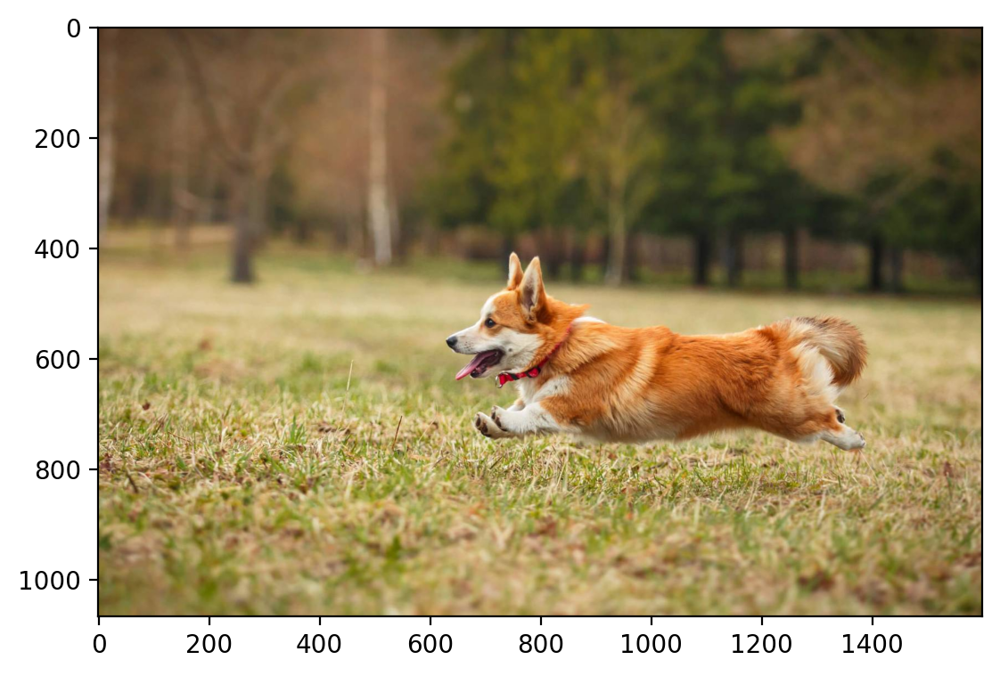

In [58]:
img=torchvision.io.read_image("dog (1).jpg").float()
img_colored=img/255
print(img_colored.shape)
plt.imshow(img_colored.permute(1,2,0))

torch.Size([3, 300, 300])


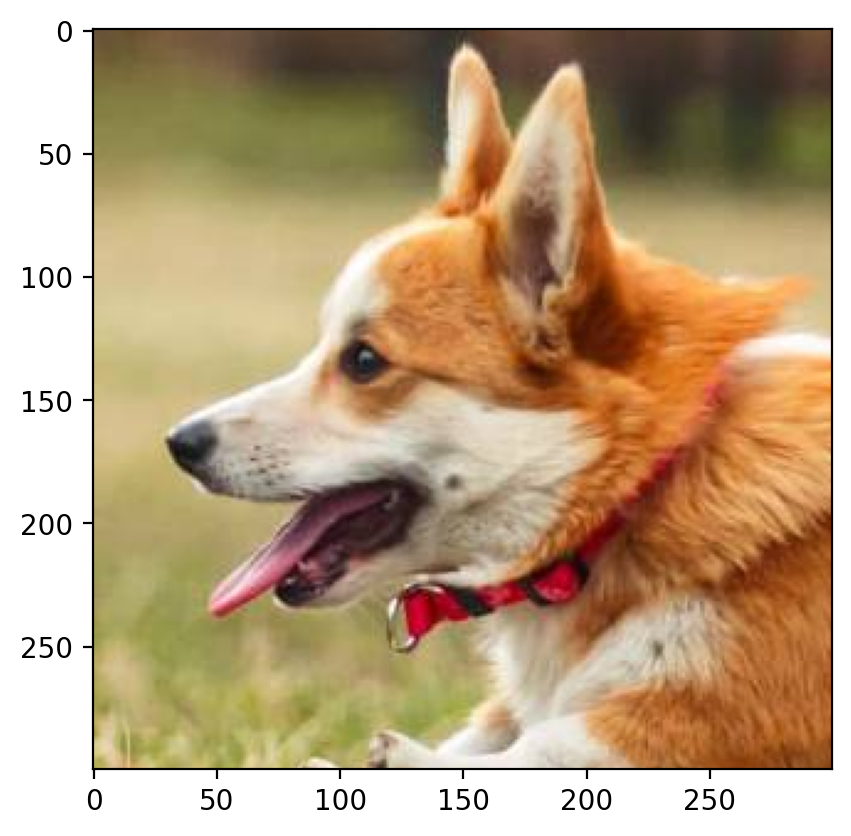

In [59]:
crop_img = torchvision.transforms.functional.crop(img, 400, 600, 300, 300)
print(crop_img.shape)
plt.imshow(crop_img.permute(1, 2, 0)/255)

1) For a rectangular block of 30X30 is assumed missing from the image.


Using gradient descent

torch.Size([3, 300, 300]) torch.Size([300, 300])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2262786..1.3589431].


For r=50:/n


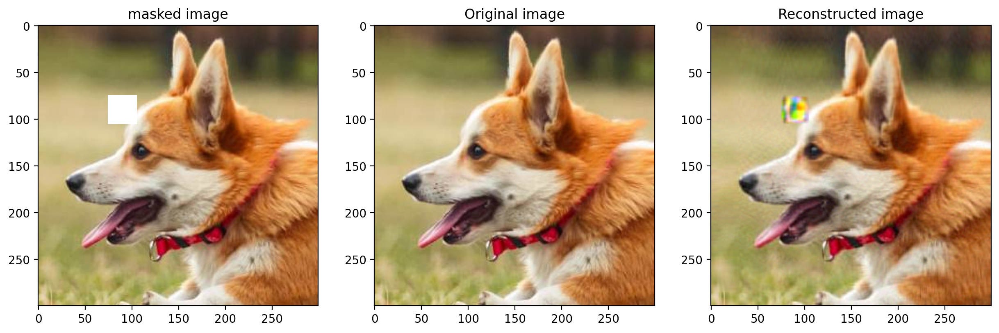

rmse:0.2230444848537445 psnr:13.032170266935676


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021131352..1.1164982].


For r=100:



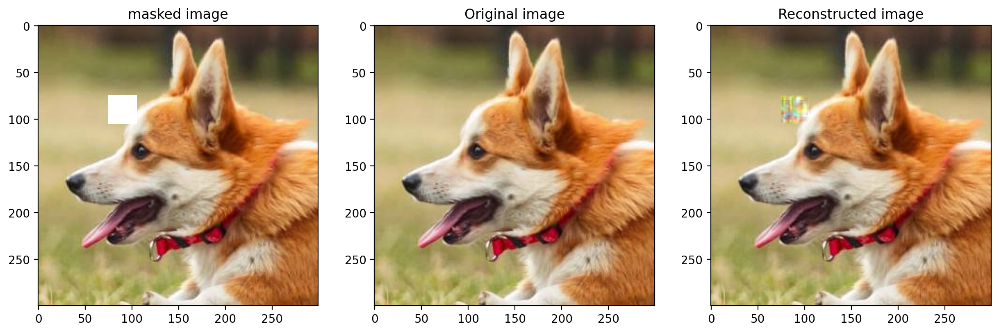

rmse:0.12138613313436508 psnr:18.316618218259023


In [60]:
def mask_rect(img, top, left, height, width):
    img_copy = img.clone()
    mask = torch.zeros(img.shape[1:], dtype=torch.bool)
    mask[top:top+height, left:left+width] = True
    img_copy[:, mask] = float('nan')
    return img_copy, mask

masked_img_rect, mask_rect_block = mask_rect(crop_img, 75, 75, 30, 30)
print(masked_img_rect.shape,mask_rect_block.shape)
# Factorization
W, H, loss = factorize(masked_img_rect, 50)

# Plot
print("For r=50:/n")
plot_images(crop_img,masked_img_rect,torch.matmul(W,H))
rmse,psnr=compute_metrics(crop_img,torch.matmul(W,H),mask_rect_block)
print(f'rmse:{rmse}',f'psnr:{psnr}')

# Factorization
W, H, loss = factorize(masked_img_rect, 100)

print("For r=100:\n")
plot_images(crop_img,masked_img_rect,torch.matmul(W,H))
rmse,psnr=compute_metrics(crop_img,torch.matmul(W,H),mask_rect_block)
print(f'rmse:{rmse}',f'psnr:{psnr}')

Using ALS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.2079215..1.7288334].


For r=50:/n


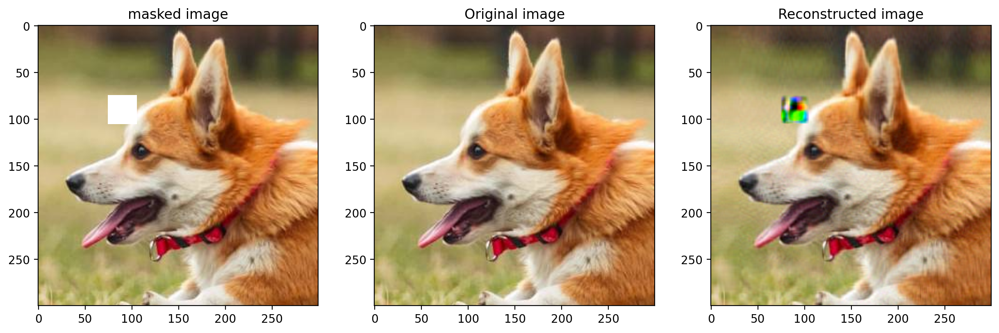

rmse:0.5518322587013245 psnr:5.163858208811982


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.656954..2.3864253].


For r=100:



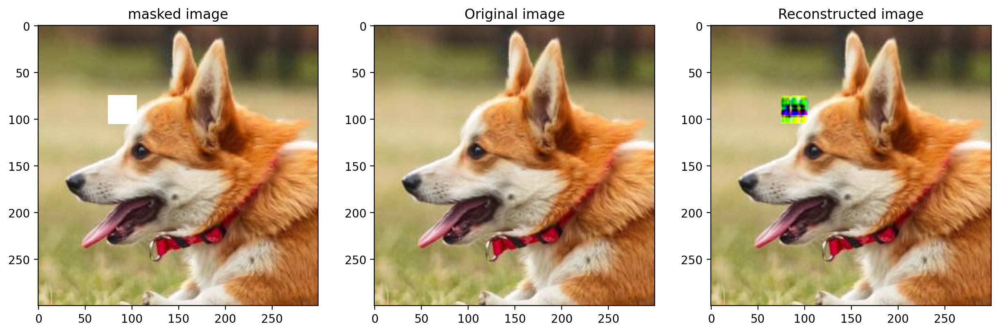

rmse:0.782856285572052 psnr:2.12635918463935


In [61]:
w_ALS,H_ALS,loss_ALS=factorize_als(masked_img_rect,50)
print("For r=50:/n")
plot_images(crop_img,masked_img_rect,torch.matmul(w_ALS,H_ALS))
rmse,psnr=compute_metrics(crop_img,torch.matmul(w_ALS,H_ALS),mask_rect_block)
print(f'rmse:{rmse}',f'psnr:{psnr}')

w_ALS,H_ALS,loss_ALS=factorize_als(masked_img_rect,100)
print("For r=100:\n")
plot_images(crop_img,masked_img_rect,torch.matmul(w_ALS,H_ALS))
rmse,psnr=compute_metrics(crop_img,torch.matmul(w_ALS,H_ALS),mask_rect_block)
print(f'rmse:{rmse}',f'psnr:{psnr}')

2) For a random subset of 900 (30X30) pixels is missing from the image.

Using gradient descent

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.042457145..1.0437124].


For r=50:

torch.Size([3, 300, 300]) torch.Size([3, 300, 300])


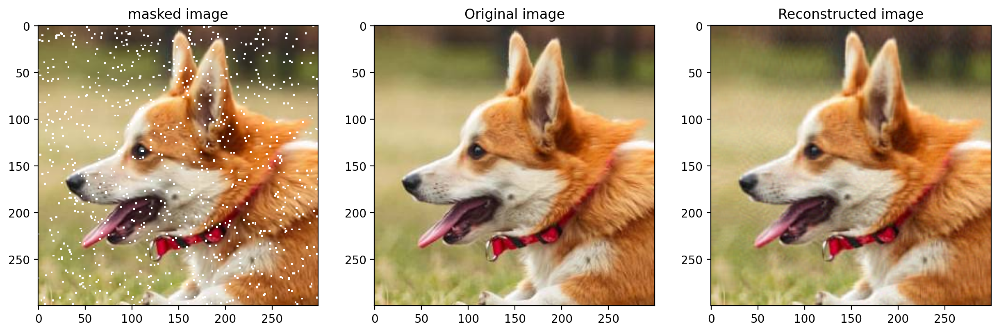

rmse:0.026294177398085594 psnr:31.60280846081522


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.037478216..1.0276984].


For r=100:

torch.Size([3, 300, 300]) torch.Size([3, 300, 300])


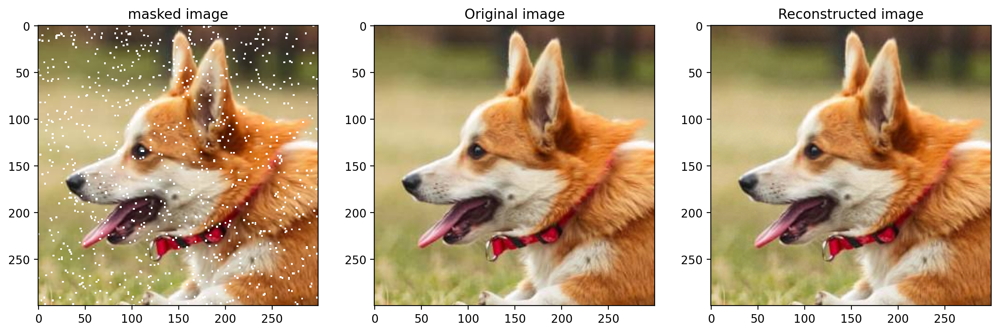

rmse:0.019608687609434128 psnr:34.151029130175246


In [62]:
# Mask the image with NaN values
def mask_random_pixels(img, num_pixels=900):
    img_copy = img.clone()                  
    h, w = img.shape[1], img.shape[2]      # Get height and width
    mask = torch.zeros(h*w, dtype=torch.bool)  # Initialize a flat boolean mask

    # Randomly select num_pixels positions
    indices = torch.randperm(h*w)[:num_pixels]
    mask[indices] = True

    mask = mask.view(h, w)                  # Reshape mask back to 2D (H x W)

    # 6. Apply NaN mask on all channels
    img_copy[:, mask] = float('nan')

    return img_copy, mask

masked_img_rand, mask_rand_block = mask_random_pixels(crop_img)

#Factorize

W, H, loss = factorize(masked_img_rand, 50)
print("For r=50:\n")
print(torch.matmul(W, H).shape,masked_img_rand.shape)
plot_images(crop_img,masked_img_rand,torch.matmul(W,H))
rmse,psnr=compute_metrics(crop_img,torch.matmul(W,H),mask_rand_block)
print(f'rmse:{rmse}',f'psnr:{psnr}')

W, H, loss = factorize(masked_img_rand, 100)
print("For r=100:\n")
print(torch.matmul(W, H).shape,masked_img_rand.shape)
plot_images(crop_img,masked_img_rand,torch.matmul(W,H))
rmse,psnr=compute_metrics(crop_img,torch.matmul(W,H),mask_rand_block)
print(f'rmse:{rmse}',f'psnr:{psnr}')

Using ALS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04234499..1.0457091].


For r=50:



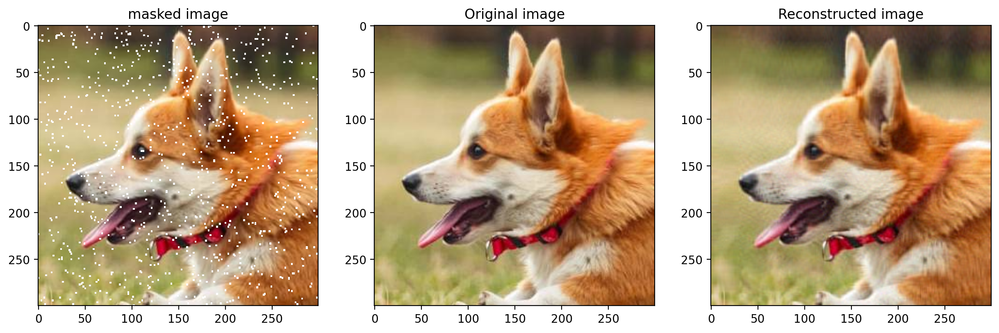

rmse:0.02620585635304451 psnr:31.63203288809031


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023147963..1.0298901].


For r=100:



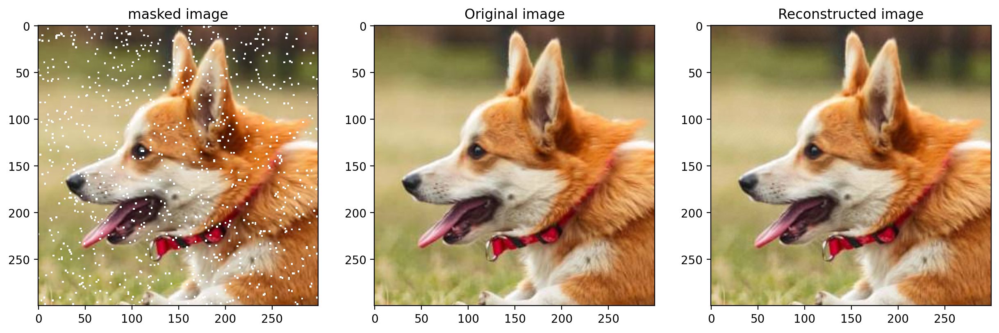

rmse:0.019484050571918488 psnr:34.2064152191122


In [63]:
w_ALS,H_ALS,loss_ALS=factorize_als(masked_img_rand,50)
print("For r=50:\n")
plot_images(crop_img,masked_img_rand,torch.matmul(w_ALS,H_ALS))
rmse,psnr=compute_metrics(crop_img,torch.matmul(w_ALS,H_ALS),mask_rand_block)
print(f'rmse:{rmse}',f'psnr:{psnr}')

w_ALS,H_ALS,loss_ALS=factorize_als(masked_img_rand,100)
print("For r=100:\n")
plot_images(crop_img,masked_img_rand,torch.matmul(w_ALS,H_ALS))
rmse,psnr=compute_metrics(crop_img,torch.matmul(w_ALS,H_ALS),mask_rand_block)
print(f'rmse:{rmse}',f'psnr:{psnr}')